In [3]:
import warnings
warnings.filterwarnings('ignore')

### Data import

In [4]:
from sklearn.datasets import fetch_20newsgroups
train_data = fetch_20newsgroups(subset='train')
test_data = fetch_20newsgroups(subset='test')

### Divide the data, and convert the labels to a floating point format for computation purposes.

In [5]:
from sklearn.model_selection import train_test_split
X_train_raw, y_train = train_data['data'], train_data['target']
X_test_raw, y_test = test_data['data'], test_data['target']

import numpy as np
y_train = y_train.astype(np.float64)
y_test = y_test.astype(np.float64)

### Let's see our available classes.

In [6]:
classdict = {}

for i in range(len(train_data['target'])):
    classdict[train_data['target'][i]] = train_data['target_names'][train_data['target'][i]]

for k in sorted(classdict.keys()):
    print(f"{k} : {classdict[k]}")

0 : alt.atheism
1 : comp.graphics
2 : comp.os.ms-windows.misc
3 : comp.sys.ibm.pc.hardware
4 : comp.sys.mac.hardware
5 : comp.windows.x
6 : misc.forsale
7 : rec.autos
8 : rec.motorcycles
9 : rec.sport.baseball
10 : rec.sport.hockey
11 : sci.crypt
12 : sci.electronics
13 : sci.med
14 : sci.space
15 : soc.religion.christian
16 : talk.politics.guns
17 : talk.politics.mideast
18 : talk.politics.misc
19 : talk.religion.misc


### Text classification dataset

Before we start classifying our data, we need to extract the embeddings from BERT. Since this process is definitive, we can do it just once and save our data, to avoid addiditonal computational costs. <br>
Let's start off with creating a dataset, to simplify the process of feeding the data into our model. It will require us to have a tokenizer, which will prepare the data for the model.

In [7]:
import torch
from torch.utils.data import Dataset

class TextClassificationDataset(Dataset):
    def __init__(self, texts, labels, tokenizer, max_length):
        self.texts = texts
        self.labels = labels
        self.tokenizer = tokenizer
        self.max_length = max_length
    def __len__(self):
        return len(self.texts)
    def __getitem__(self, idx):
        text = self.texts[idx]
        label = self.labels[idx]
        encoding = self.tokenizer(text, return_tensors='pt', max_length=self.max_length, padding='max_length', truncation=True)
        return {'input_ids': encoding['input_ids'].flatten(), 'attention_mask': encoding['attention_mask'].flatten(), 'label': torch.tensor(label)}

### BERT classifier for the purpose of data engineering.

We will base our classification pipeline on two models. Firstly, we will convert the input text data using Bidirectional Encoder from Transformers (BERT) model to a 768-dimensional latent space. This step fill extract important features for our second model - a gradient-boosted decision tree, which will learn to distinguish classes basing on the information contained in the aforementioned latent space generated by BERT.

In [8]:
from torch import nn
from transformers import BertModel

class BERTClassifier(nn.Module):
    def __init__(self, bert_model_name):
        super(BERTClassifier, self).__init__()
        self.bert = BertModel.from_pretrained(bert_model_name, output_hidden_states=True)

    def forward(self, input_ids, attention_mask):
        outputs = self.bert(input_ids=input_ids, attention_mask=attention_mask)
        pooled_output = outputs.pooler_output
        return pooled_output

Now that we have the implementation of our model, let's create a handy function, which will extract embeddings from the last layer of our model. Those embeddings will later be used by a decision tree for classification purposes.

In [9]:
def get_bert_embeddings(tokens_tensor, masked_tensors, model):
   with torch.no_grad():
      outputs = model(tokens_tensor, masked_tensors)
      hidden_states = outputs[0]
   token_embeddings = torch.squeeze(hidden_states, dim=0)
   return token_embeddings

Now, let's instantiate our required objects, as well as set up some hyperparameters, necessary for preprocessing our data. <br><br>
We are going to use the *BERT uncased* model, trained on large text datasets, but for no specific purpose. It is important that we use a *vanilla* model to prevent any influence on our embeddings.

In [10]:
bert_model_name = 'bert-base-uncased'

In [11]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using {device} device.")
model = BERTClassifier(bert_model_name).to(device)

Using cpu device.


Let's instantiate the rest of our necessary objects. The tokenizer takes the BERT model name as an argument, to create a tokenizer suited for the model chosen from the library. Then, the tokenizer is passed to our custom dataset implementation, for straightforward raw data tokenization. An additional argument *max_length* is passed too - it controls the length of an input sentence.

In [12]:
from transformers import BertTokenizer
from torch.utils.data import DataLoader

tokenizer = BertTokenizer.from_pretrained(bert_model_name)
train_dataset = TextClassificationDataset(X_train_raw, y_train, tokenizer, max_length=512)
test_dataset = TextClassificationDataset(X_test_raw, y_test, tokenizer, max_length=512)
train_dataloader = DataLoader(train_dataset, batch_size=1)
test_dataloader = DataLoader(test_dataset, 1)

Let's write a simple loop which will iterate through our data, feed it into BERT, extract the necessary embeddings, and save them to our disk for later use. We use *batch_size=1* for data loading to easily control the building of our data tensor to be saved.

In [ ]:
input_names = ['train_data', 'test_data']
target_names = ['train_target', 'test_target']
dataloaders = [train_dataloader, test_dataloader]

import sys
for input_name, target_name, dataloader in zip(input_names, target_names, dataloaders):
    l = len(dataloader)
    flag = False
    for i, batch in enumerate(dataloader):
        sys.stdout.write(f"\rProcessing sample {i+1} of {l}")
        token_embeddings = get_bert_embeddings(batch['input_ids'].to(device), batch['attention_mask'].to(device), model)
        target = batch['label']

        if not flag:
            data = token_embeddings
            label = target
            flag = True
        else:
            data = np.vstack((data, token_embeddings))
            label = np.vstack((label, target))
    print(f"\nShape of {input_name}: {data.shape}")
    print(f"Shape of {target_name}: {label.shape}")
    print(f"Saving data as {input_name+'.npy'}")
    np.save(input_name+'.npy', data)
    print(f"Saving labels as {target_name+'.npy'}")
    np.save(target_name+'.npy', label)
    print()

After the embeddings have successfully been extracted and saved to our hard drive, we can now load them and use them for classfication.

In [3]:
import numpy as np
train_inputs, train_target = np.load('train_data.npy'), np.load('train_target.npy')
test_inputs, test_target = np.load('test_data.npy'), np.load('test_target.npy')

Now, let's split our training data into train and validation sets. Remember, that test data should be left untouched until the final version of the model is ready to ensure an unbiased training process.

In [4]:
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(train_inputs, train_target, test_size=0.1)

Now, having finished all the data work, we can approach training our classification models. We will focus on LGBM and XGBoost for tree gradient boosting. Additionally, we will take advantage of a GridSearch and Optuna for hyperparameter tuning for our trees.

In [16]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_auc_score
from xgboost import XGBClassifier
import lightgbm as lgbm
import joblib
import optuna
from sklearn.metrics import f1_score

In [17]:
xgboost_params = {
        'n_estimators' : [100, 1000],
        'max_depth' : [8],
        'learning_rate' : [0.01, 0.1],
        'subsample' : [0.6, 0.9],
        'device' : ['cuda']
        }

lgbm_params = {
    'n_estimators' : [100, 1000],
    'max_depth' : [8],
    'learning_rate' : [0.01, 0.1],
    'subsample' : [0.6, 0.9],
    'device' : ['gpu']
}

Additionally, let's add a simple timer function to measure the time taken:

In [18]:
import datetime
def timer(start_time=None):
    if not start_time:
        start_time = datetime.datetime.now()
        return start_time
    elif start_time:
        thour, temp_sec = divmod((datetime.datetime.now() - start_time).total_seconds(), 3600)
        tmin, tsec = divmod(temp_sec, 60)
        print('\n Time taken: %i hours %i minutes and %s seconds.' % (thour, tmin, round(tsec, 2)))

Now, let's instantiate our models, as well as the training procedures.

In [19]:
xgb_clf = XGBClassifier()
lgbm_clf = lgbm.LGBMClassifier()

In [20]:
random_search_xgb = GridSearchCV(xgb_clf, param_grid=xgboost_params, scoring='f1_macro', verbose=3)
random_search_lgbm = GridSearchCV(lgbm_clf, param_grid=lgbm_params, scoring='f1_macro', verbose=3)
study_xgb = optuna.create_study(study_name="xgboost", direction="maximize")
study_lgbm = optuna.create_study(study_name="lgbm", direction="maximize")

[I 2024-06-01 08:46:38,052] A new study created in memory with name: xgboost
[I 2024-06-01 08:46:38,052] A new study created in memory with name: lgbm


And lastly, we start the training procedures, measure the time taken, and then compare the results, and save the models if we wish to.

In [21]:
start_time = timer(None)
random_search_xgb.fit(X_train, y_train)
timer(start_time)

Fitting 5 folds for each of 8 candidates, totalling 40 fits
[CV 1/5] END device=cuda, learning_rate=0.01, max_depth=8, n_estimators=100, subsample=0.6;, score=0.461 total time= 1.0min
[CV 2/5] END device=cuda, learning_rate=0.01, max_depth=8, n_estimators=100, subsample=0.6;, score=0.466 total time= 1.0min
[CV 3/5] END device=cuda, learning_rate=0.01, max_depth=8, n_estimators=100, subsample=0.6;, score=0.475 total time= 1.0min
[CV 4/5] END device=cuda, learning_rate=0.01, max_depth=8, n_estimators=100, subsample=0.6;, score=0.460 total time= 1.0min
[CV 5/5] END device=cuda, learning_rate=0.01, max_depth=8, n_estimators=100, subsample=0.6;, score=0.451 total time= 1.0min
[CV 1/5] END device=cuda, learning_rate=0.01, max_depth=8, n_estimators=100, subsample=0.9;, score=0.424 total time= 1.2min
[CV 2/5] END device=cuda, learning_rate=0.01, max_depth=8, n_estimators=100, subsample=0.9;, score=0.446 total time= 1.2min
[CV 3/5] END device=cuda, learning_rate=0.01, max_depth=8, n_estimators=

In [22]:
joblib.dump(random_search_xgb.best_estimator_, 'best_xgb_gridsearch.pkl', compress=1)
print(f"Best parameters: {random_search_xgb.best_params_}")

Best parameters: {'device': 'cuda', 'learning_rate': 0.1, 'max_depth': 8, 'n_estimators': 1000, 'subsample': 0.6}


In [23]:
start_time = timer(None)
random_search_lgbm.fit(X_train, y_train)
timer(start_time)

Fitting 5 folds for each of 8 candidates, totalling 40 fits
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 194061
[LightGBM] [Info] Number of data points in the train set: 8145, number of used features: 768
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 756 dense feature groups (5.87 MB) transferred to GPU in 0.009667 secs. 1 sparse feature groups
[LightGBM] [Info] Start training from score -3.161615
[LightGBM] [Info] Start training from score -2.996346
[LightGBM] [Info] Start training from scor

In [24]:
joblib.dump(random_search_lgbm.best_estimator_, 'best_lgbm_gridsearch.pkl', compress=1)
print(f"Best parameters: {random_search_lgbm.best_params_}")

Best parameters: {'device': 'gpu', 'learning_rate': 0.1, 'max_depth': 8, 'n_estimators': 1000, 'subsample': 0.9}


For the purposes of saving best model in Optuna we need a callback - let's create nice and handy OOP-based interface to work with.

In [25]:
class OptunaObjective():
    def __init__(self):
        self.best_booster = None
        self._booster = None
    
    def callback(self, study, trial):
        if study.best_trial == trial:
            self.best_booster = self._booster


class OptunaLGBMObjective(OptunaObjective):
    def __init__(self):
        super(OptunaObjective, self).__init__()
    
    def __call__(self, trial):
        param_lgb = {
        "verbosity": -1,
        "n_estimators" : trial.suggest_int("n_estimators", 100, 1000, log=True),
        "boosting_type": "gbdt",
        "max_depth" : trial.suggest_int("max_depth", 1, 8, log=True),
        "learning_rate" : trial.suggest_float("learning_rate", 1e-8, 1.0, log=True),
        "subsample" : trial.suggest_float("subsample", 0.1, 0.9, log=True),
        "device" : "gpu",
        }

        mdl = lgbm.LGBMClassifier(**param_lgb)

        self._booster = mdl

        mdl.fit(X_train, y_train)

        pred = mdl.predict(X_val)

        score = f1_score(y_true=y_val, y_pred=pred, average='macro')

        return score

class OptunaXGBObjective(OptunaObjective):
    def __init__(self):
        super(OptunaObjective, self).__init__()
    
    def __call__(self, trial):
        param_xgb = {
        "xgb_verbosity": -1,
        "n_estimators" : trial.suggest_int("n_estimators", 100, 1000, log=True),
        "xgb_booster": trial.suggest_categorical("booster", ["gbtree"]),
        "xgb_max_depth" : trial.suggest_int("max_depth", 1, 8, log=True),
        "xgb_eta" : trial.suggest_float("eta", 1e-8, 1.0, log=True),
        "subsample" : trial.suggest_float("subsample", 0.1, 0.9, log=True),
        "device" : "cuda"
        }

        mdl = XGBClassifier(**param_xgb)

        self._booster = mdl

        mdl.fit(X_train, y_train)

        pred = mdl.predict(X_val)

        score = f1_score(y_true = y_val, y_pred = pred, average='macro')

        return score

In [26]:
start_time = timer(None)
obj_xgb = OptunaXGBObjective()
study_xgb.optimize(obj_xgb, n_trials=50, callbacks=[obj_xgb.callback])
timer(start_time)

[I 2024-06-01 13:50:59,558] Trial 0 finished with value: 0.5740659401167194 and parameters: {'n_estimators': 331, 'booster': 'gbtree', 'max_depth': 6, 'eta': 0.0007567323039615205, 'subsample': 0.46967440354575846}. Best is trial 0 with value: 0.5740659401167194.
[I 2024-06-01 13:52:24,506] Trial 1 finished with value: 0.5684571063909533 and parameters: {'n_estimators': 723, 'booster': 'gbtree', 'max_depth': 6, 'eta': 6.637759894080601e-06, 'subsample': 0.8233967373142914}. Best is trial 0 with value: 0.5740659401167194.
[I 2024-06-01 13:52:56,563] Trial 2 finished with value: 0.5420363678207334 and parameters: {'n_estimators': 136, 'booster': 'gbtree', 'max_depth': 1, 'eta': 0.0986096522870203, 'subsample': 0.684633786699059}. Best is trial 0 with value: 0.5740659401167194.
[I 2024-06-01 13:53:36,326] Trial 3 finished with value: 0.5483905153682884 and parameters: {'n_estimators': 195, 'booster': 'gbtree', 'max_depth': 1, 'eta': 3.28739840210043e-06, 'subsample': 0.5226455925781306}. 


 Time taken: 0 hours 50 minutes and 24.74 seconds.


In [27]:
joblib.dump(obj_xgb.best_booster, 'best_xgb_optuna.pkl', compress=1)

['best_xgb_optuna.pkl']

In [28]:
start_time = timer(None)
obj_lgbm = OptunaLGBMObjective()
study_lgbm.optimize(obj_lgbm, n_trials=50, callbacks=[obj_lgbm.callback])
timer(start_time)

[I 2024-06-01 14:40:33,947] Trial 0 finished with value: 0.003986429177268872 and parameters: {'n_estimators': 125, 'max_depth': 1, 'learning_rate': 8.670999741228013e-07, 'subsample': 0.16429758849922307}. Best is trial 0 with value: 0.003986429177268872.
[I 2024-06-01 14:41:40,497] Trial 1 finished with value: 0.21835327468954255 and parameters: {'n_estimators': 645, 'max_depth': 3, 'learning_rate': 9.999794373950259e-05, 'subsample': 0.20116788564472}. Best is trial 1 with value: 0.21835327468954255.
[I 2024-06-01 14:41:48,531] Trial 2 finished with value: 0.003986429177268872 and parameters: {'n_estimators': 170, 'max_depth': 2, 'learning_rate': 2.795955409645038e-07, 'subsample': 0.47125675122103255}. Best is trial 1 with value: 0.21835327468954255.
[I 2024-06-01 14:41:52,405] Trial 3 finished with value: 0.12169350764181516 and parameters: {'n_estimators': 175, 'max_depth': 1, 'learning_rate': 0.0009263949724890763, 'subsample': 0.32360944665136704}. Best is trial 1 with value: 0


 Time taken: 1 hours 24 minutes and 1.8 seconds.


Now, it's time to save our best models.

In [29]:
joblib.dump(obj_lgbm.best_booster, 'best_lgbm_optuna.pkl', compress=1)

['best_lgbm_optuna.pkl']

Lastly, let's load our models, and evaluate their performance on a test set.

In [30]:
xgb_clf_grid = joblib.load('best_xgb_gridsearch.pkl')
lgbm_clf_grid = joblib.load('best_lgbm_gridsearch.pkl')
xgb_clf_optuna = joblib.load('best_xgb_optuna.pkl')
lgbm_clf_optuna = joblib.load('best_lgbm_optuna.pkl')

In [31]:
models = [xgb_clf_grid, lgbm_clf_grid, xgb_clf_optuna, lgbm_clf_optuna]

model_names = [
    "GridSearch-optimized XGBClassifier",
    "GridSearch-optimized LGBMClassifier",
    "Optuna-optimized XGBClassifier",
    "Optuna-optimized LGBMClassifier"
]

In [33]:
for model, name in zip(models, model_names):
    print(f"{name} - F1 score: {f1_score(test_target, model.predict(test_inputs), average='macro')}")

GridSearch-optimized XGBClassifier - F1 score: 0.5537349328367561
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
GridSearch-optimized LGBMClassifier - F1 score: 0.5592185684662935
Optuna-optimized XGBClassifier - F1 score: 0.5519180849954883
Optuna-optimized LGBMClassifier - F1 score: 0.5498741276344672


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


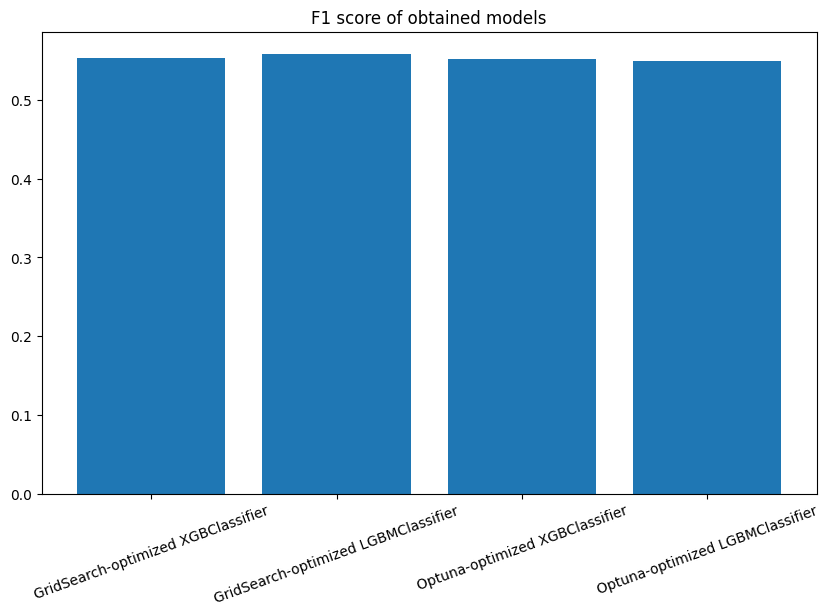

In [48]:
import matplotlib.pyplot as plt
scores = [f1_score(test_target, model.predict(test_inputs), average='macro') for model in models]
plt.figure(figsize=(10,6))
plt.bar([1,2,3,4], scores)
plt.xticks([1,2,3,4], labels=model_names, rotation=20)
plt.title("F1 score of obtained models")
plt.show()

Fitting for 767 components of max 768

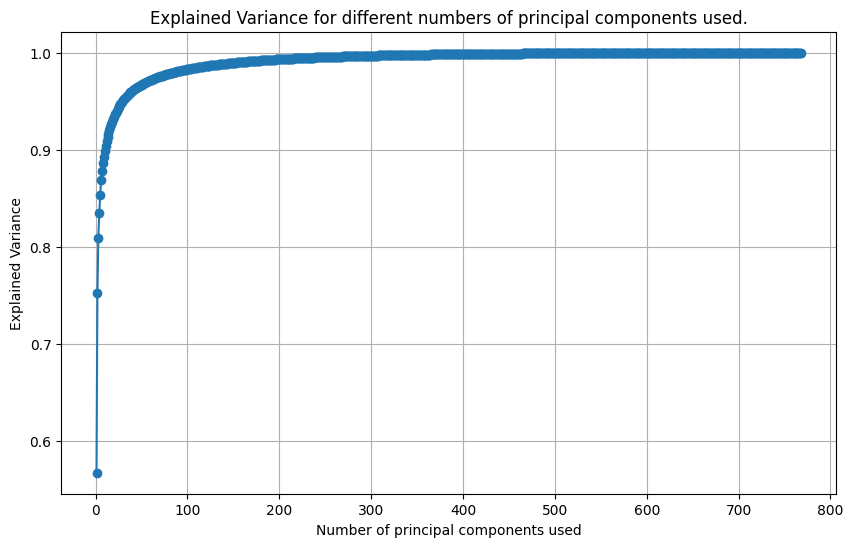

In [6]:
import numpy as np
from sklearn.decomposition import PCA
import sys
import matplotlib.pyplot as plt

# Obliczanie explained variance dla różnych ilości komponentów głównych
ilosci_komponentow = np.arange(1, np.vstack((X_train, X_val)).shape[1]+1)
explained_variance = []

for i, n_components in enumerate(ilosci_komponentow):
    sys.stdout.write(f"\rFitting for {i} components of max {len(ilosci_komponentow)}")
    sys.stdout.flush()
    pca = PCA(n_components=n_components)
    pca.fit(np.vstack((X_train,X_val)))
    explained_variance.append(np.sum(pca.explained_variance_ratio_))

# Tworzenie wykresu
plt.figure(figsize=(10, 6))
plt.plot(ilosci_komponentow, explained_variance, marker='o', linestyle='-')
plt.xlabel('Number of principal components used')
plt.ylabel('Explained Variance')
plt.title('Explained Variance for different numbers of principal components used.')
plt.grid(True)
plt.show()